In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


In [56]:
df=pd.read_csv(r'/content/training_data (2).csv')
df.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.0,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.0,6.0,1.0
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.0,3.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.0,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.0,20.0,1.0


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440833 entries, 0 to 440832
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CustomerID         440832 non-null  float64
 1   Age                440832 non-null  float64
 2   Gender             440832 non-null  object 
 3   Tenure             440832 non-null  float64
 4   Usage Frequency    440832 non-null  float64
 5   Support Calls      440832 non-null  float64
 6   Payment Delay      440832 non-null  float64
 7   Subscription Type  440832 non-null  object 
 8   Contract Length    440832 non-null  object 
 9   Total Spend        440832 non-null  float64
 10  Last Interaction   440832 non-null  float64
 11  Churn              440832 non-null  float64
dtypes: float64(9), object(3)
memory usage: 40.4+ MB


In [58]:
df.isnull().sum()

,0
CustomerID,1
Age,1
Gender,1
Tenure,1
Usage Frequency,1
Support Calls,1
Payment Delay,1
Subscription Type,1
Contract Length,1
Total Spend,1


In [59]:
df.dropna(inplace=True)

In [60]:
df.duplicated().sum()

np.int64(0)

In [61]:
for x in df.select_dtypes(include='float64').columns:
  df[x]=df[x].astype('int64')

In [62]:
df[df.select_dtypes(include='object').columns]=df[df.select_dtypes(include='object').columns].astype('category')

In [63]:
numeric_columns = df.select_dtypes(include=['number'])

outliers = {}

for col in numeric_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]

for col, values in outliers.items():
    print(f"{col}: {len(values)} outliers")

CustomerID: 0 outliers
Age: 0 outliers
Tenure: 0 outliers
Usage Frequency: 0 outliers
Support Calls: 0 outliers
Payment Delay: 0 outliers
Total Spend: 0 outliers
Last Interaction: 0 outliers
Churn: 0 outliers


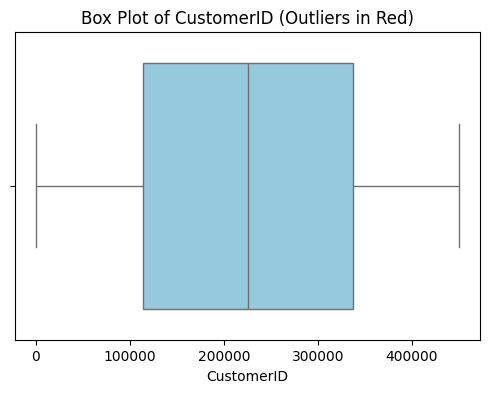

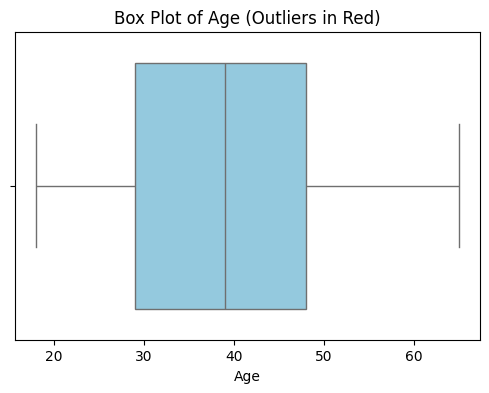

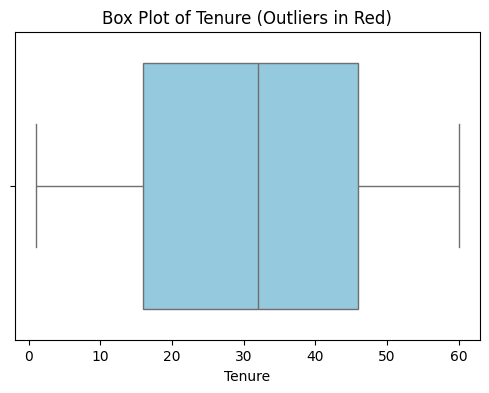

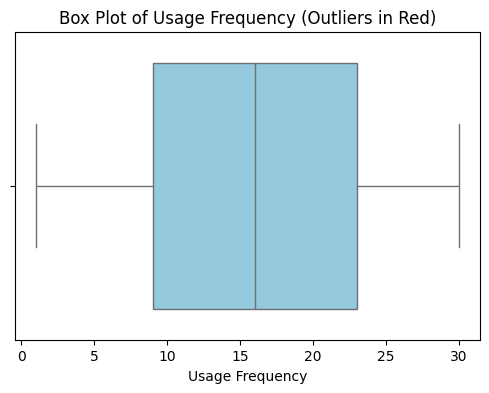

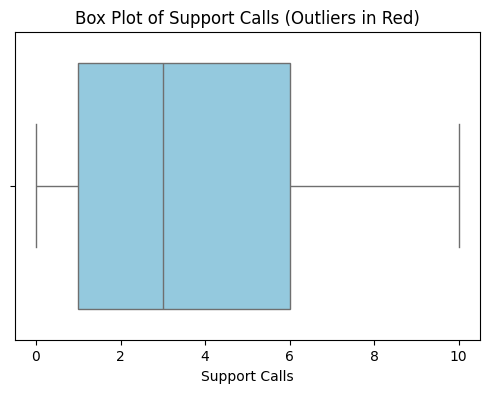

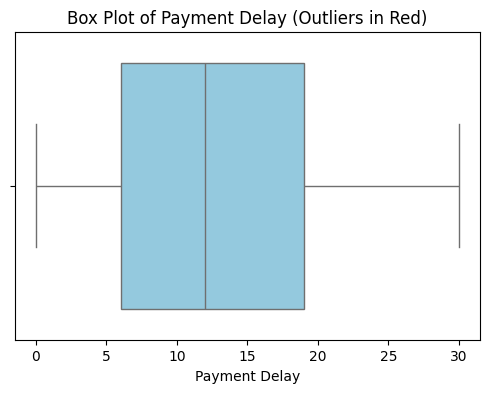

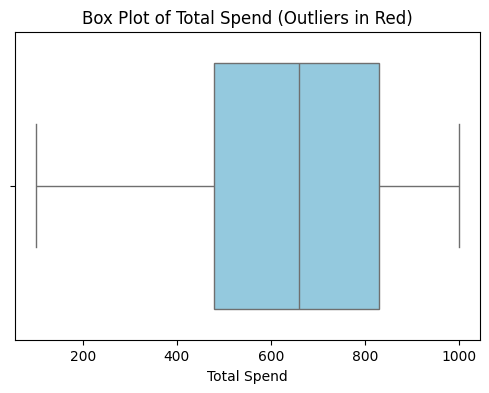

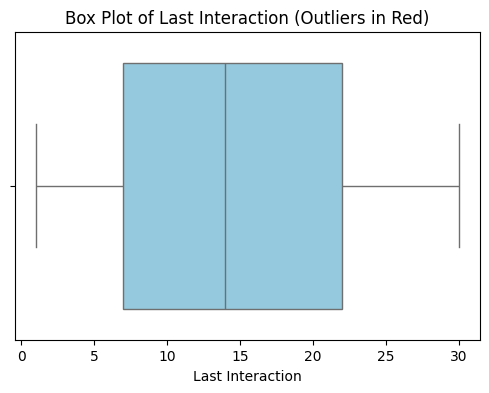

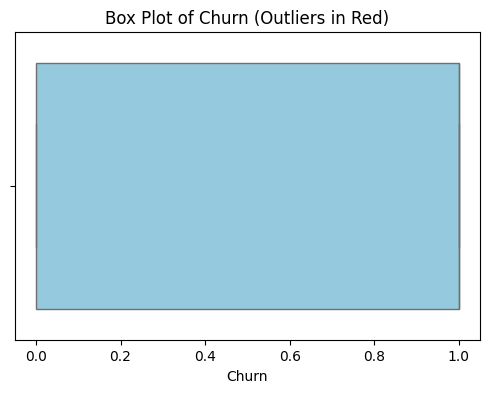

In [64]:
numeric_columns = df.select_dtypes(include=['number'])
for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[column], color="skyblue", flierprops=dict(marker='o', markersize=8, markerfacecolor='red'))
    plt.title(f"Box Plot of {column} (Outliers in Red)")
    plt.show()

In [65]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerID,440832.0,225398.667955,129531.918550,2.0,113621.75,226125.5,337739.25,449999.0
Age,440832.0,39.373153,12.442369,18.0,29.00,39.0,48.00,65.0
Tenure,440832.0,31.256336,17.255727,1.0,16.00,32.0,46.00,60.0
Usage Frequency,440832.0,15.807494,8.586242,1.0,9.00,16.0,23.00,30.0
Support Calls,440832.0,3.604437,3.070218,0.0,1.00,3.0,6.00,10.0
Payment Delay,440832.0,12.965722,8.258063,0.0,6.00,12.0,19.00,30.0
Total Spend,440832.0,631.344771,240.722712,100.0,480.00,661.0,830.00,1000.0
Last Interaction,440832.0,14.480868,8.596208,1.0,7.00,14.0,22.00,30.0
Churn,440832.0,0.567107,0.495477,0.0,0.00,1.0,1.00,1.0


In [66]:
df.describe(include='category').T

,count,unique,top,freq
Gender,440832,2,Male,250252
Subscription Type,440832,3,Standard,149128
Contract Length,440832,3,Annual,177198


In [67]:
df.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2,30,Female,39,14,5,18,Standard,Annual,932,17,1
1,3,65,Female,49,1,10,8,Basic,Monthly,557,6,1
2,4,55,Female,14,4,6,18,Basic,Quarterly,185,3,1
3,5,58,Male,38,21,7,7,Standard,Monthly,396,29,1
4,6,23,Male,32,20,5,8,Basic,Monthly,617,20,1


In [68]:
def get_Pie(data, col):
    '''
    Creates pie chart that automatically adjusts to the number of categories
    '''
    values = data[col].value_counts()
    explode = [0.1] + [0]*(len(values)-1)
    colors = ['#FFD700', '#FFB6C1', '#87CEEB', '#98FB98', '#DDA0DD', '#FFA07A']

    plt.pie(
        values,
        labels=values.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors[:len(values)],
        explode=explode,
        shadow=True,
        wedgeprops={'edgecolor': 'brown', 'linewidth': 2}
    )

    plt.title(f'{col} State', fontweight='bold')
    plt.gca().axis('equal')

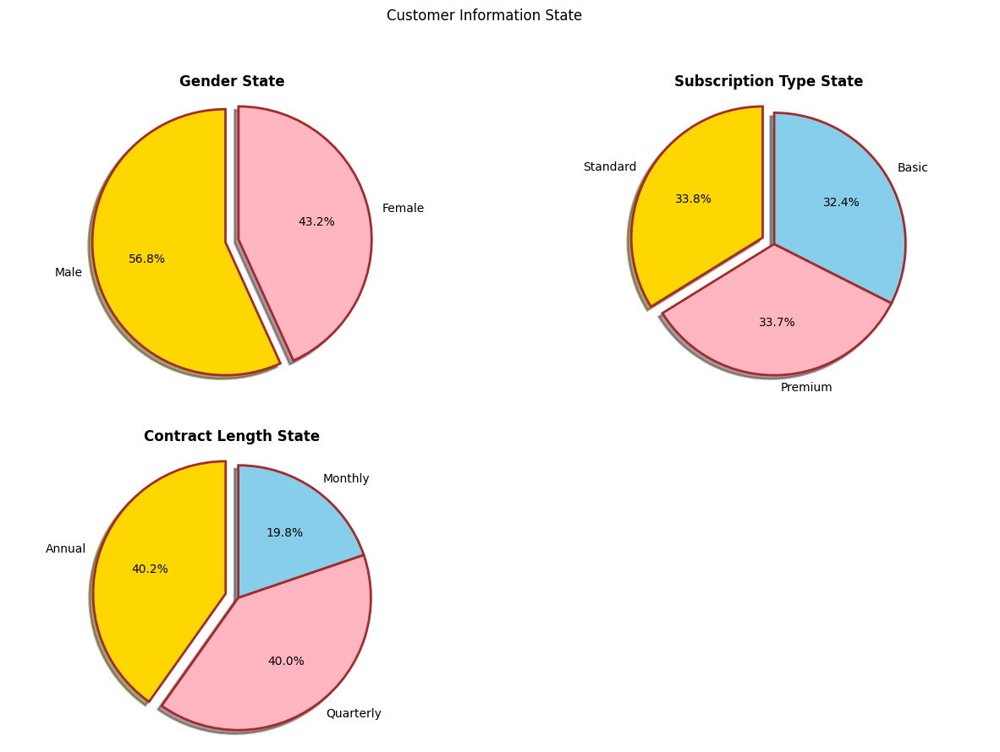

In [69]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.suptitle('Customer Information State')

# Gender State.
get_Pie(df,'Gender')

#Subscription Type State.
plt.subplot(2,2,2)
get_Pie(df,'Subscription Type')

#Contract Length State.
plt.subplot(2,2,3)
get_Pie(df,'Contract Length')

plt.show()

In [70]:
def countplot_ratio(df, x, hue=None, ax=None, rotate_xlabel=0):
    ax = sns.countplot(data=df, x=x, hue=hue, ax=ax)
    # Rotate x-axis labels based on the rotate_xlabel parameter
    ax.set_xticklabels(ax.get_xticklabels(), rotation=rotate_xlabel)
    ax.set_title(x + " Distributions")

    total = float(len(df))
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.text(p.get_x() + p.get_width() / 2., height + 3,
                    '{:.2f}%'.format((height / total) * 100),
                    fontsize=12, weight='bold',ha="center")

<ipython-input-70-9a339fc70299>:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-70-9a339fc70299>:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

<ipython-input-70-9a339fc70299>:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



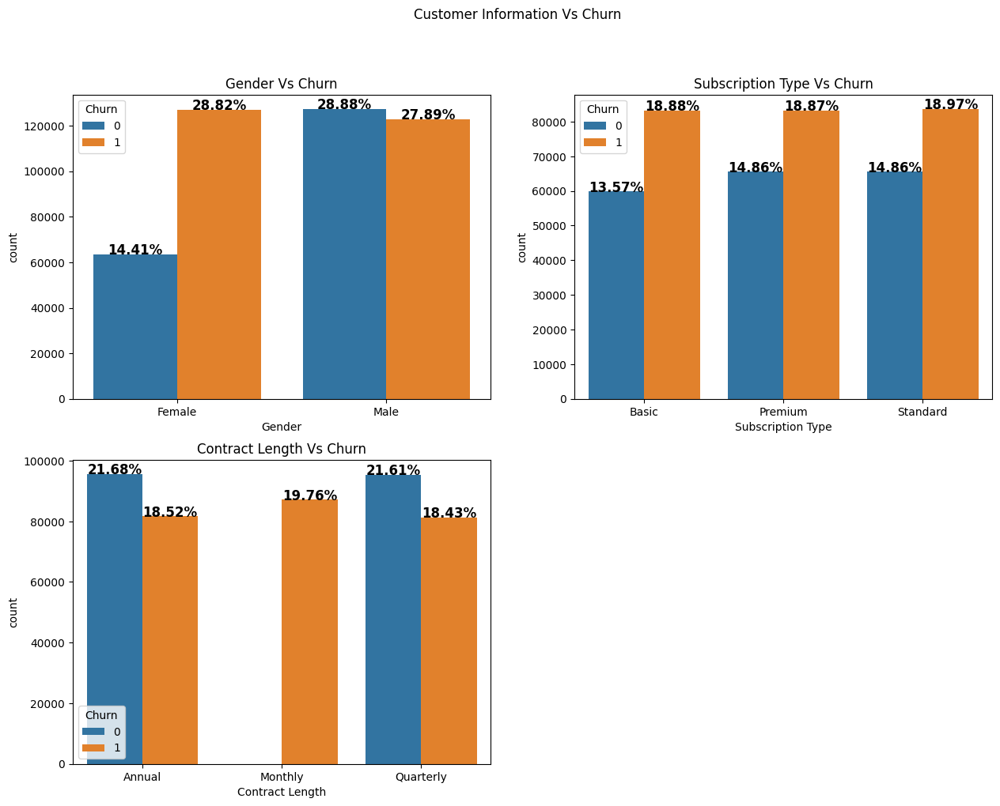

In [71]:
plt.figure(figsize=(15,11))
plt.subplot(2,2,1)
plt.suptitle("Customer Information Vs Churn")

# Gender Plot.
countplot_ratio(df,x='Gender',hue='Churn')
plt.title('Gender Vs Churn')

# Subscription Type Plot.
plt.subplot(2,2,2)
countplot_ratio(df,x='Subscription Type',hue='Churn')
plt.title('Subscription Type Vs Churn')

# Contract Length Plot.
plt.subplot(2,2,3)
countplot_ratio(df, x='Contract Length',hue='Churn')
plt.title('Contract Length Vs Churn')


plt.show()

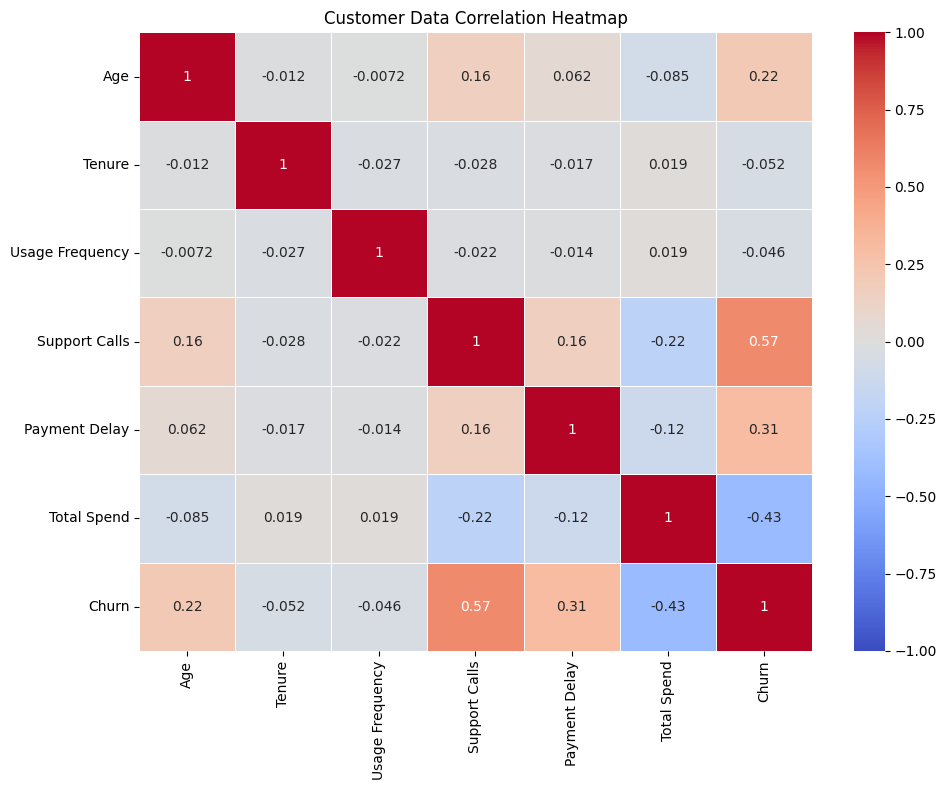

In [72]:
numerical_cols = ['Age', 'Tenure', 'Usage Frequency', 'Support Calls',
                  'Payment Delay', 'Total Spend', 'Churn']
corr_df = df[numerical_cols]

# Calculate correlation matrix
correlation_matrix = corr_df.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,      # Show correlation values
    cmap='coolwarm', # Red (positive) to Blue (negative)
    vmin=-1, vmax=1, # Fix scale from -1 to 1
    linewidths=0.5
)
plt.title('Customer Data Correlation Heatmap')
plt.tight_layout()
plt.show()

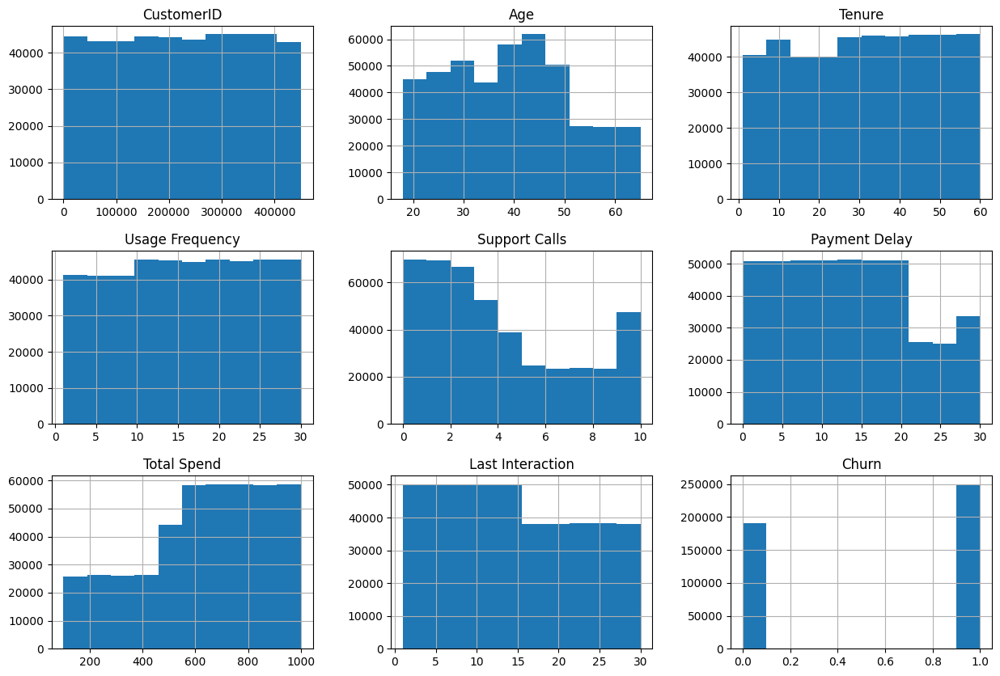

In [73]:
df.hist(figsize=(15,10))
plt.show()

In [74]:
Supcall='Support Calls'
Totspnd='Total Spend'

In [75]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn'],
      dtype='object')

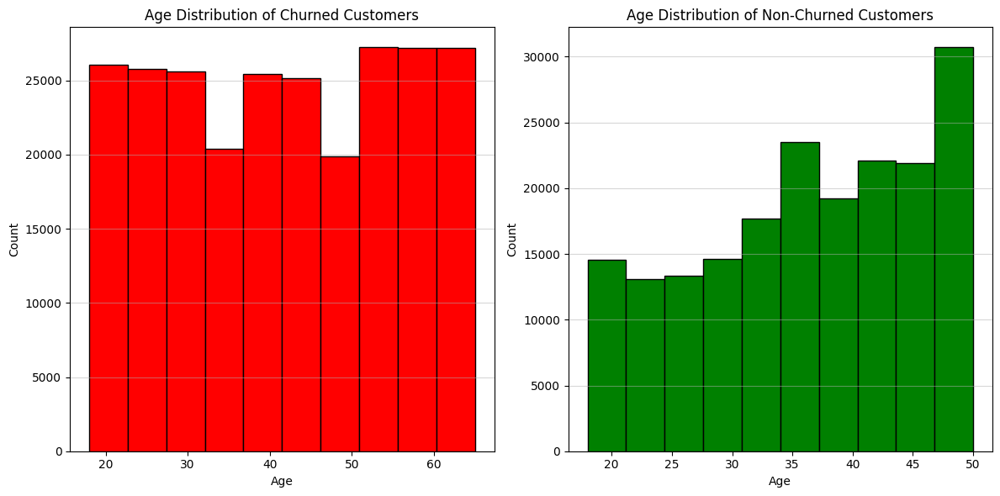

In [76]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df[df['Churn'] == 1]['Age'], bins=10, color='red', edgecolor='black')
plt.title('Age Distribution of Churned Customers')
plt.xlabel('Age')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.5)

plt.subplot(1, 2, 2)
plt.hist(df[df['Churn'] == 0]['Age'], bins=10, color='green', edgecolor='black')
plt.title('Age Distribution of Non-Churned Customers')
plt.xlabel('Age')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.5)

plt.tight_layout()
plt.show()

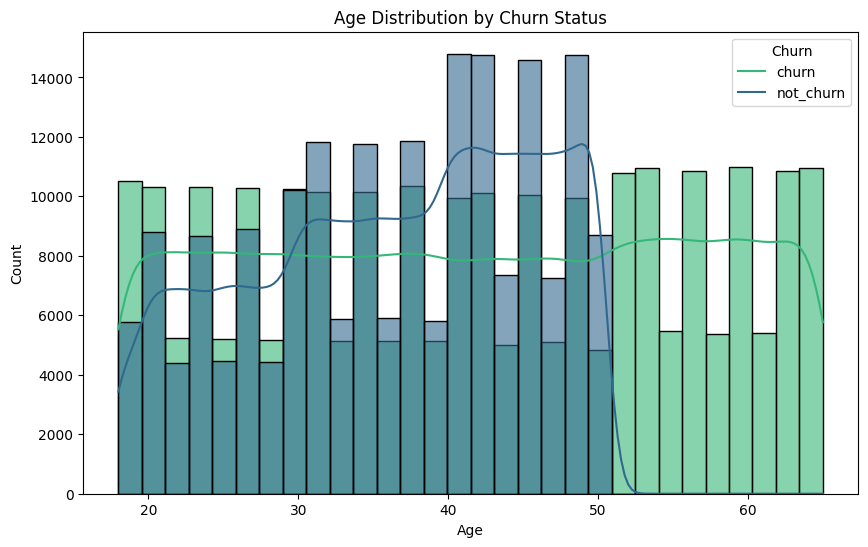

In [77]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Age', hue='Churn', kde=True, bins=30, palette='viridis', alpha=0.6)
plt.title('Age Distribution by Churn Status')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend(title='Churn', labels=['churn', 'not_churn'])
plt.show()

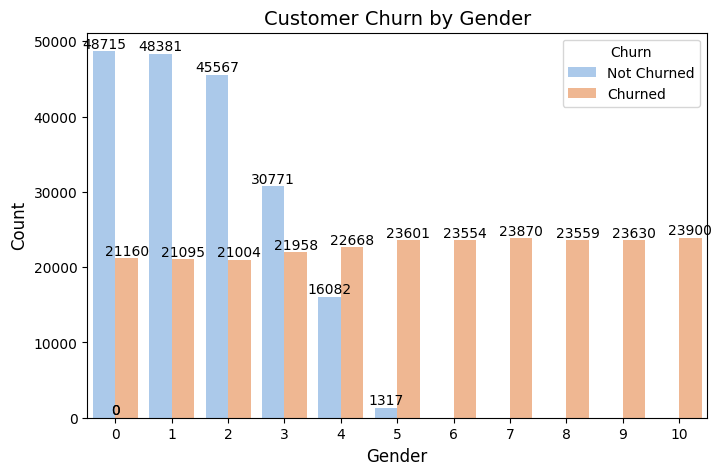

In [78]:
plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df, x='Support Calls', hue='Churn', palette='pastel')

# Customize plot
plt.title('Customer Churn by Gender', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Churn', labels=['Not Churned', 'Churned'])

# Add count labels on top of each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',  # Display the count as an integer
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position (x, y)
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment
        xytext=(0, 5),  # Offset from the bar
        textcoords='offset points',
        fontsize=10
    )

plt.show()

<ipython-input-79-2b963d2e5ec7>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




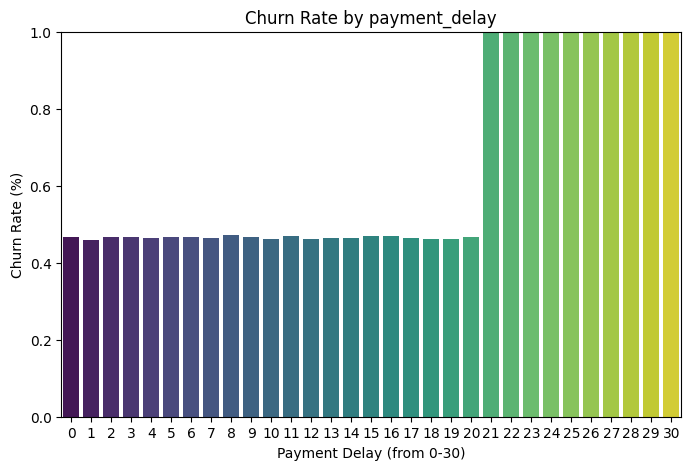

In [79]:
churn_rate = df.groupby('Payment Delay')['Churn'].mean().reset_index()

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(data=churn_rate, x='Payment Delay', y='Churn', palette='viridis')
plt.title('Churn Rate by payment_delay')
plt.xlabel('Payment Delay (from 0-30)')
plt.ylabel('Churn Rate (%)')
plt.ylim(0, 1)  # Adjust if churn is not binary (0/1)
plt.show()

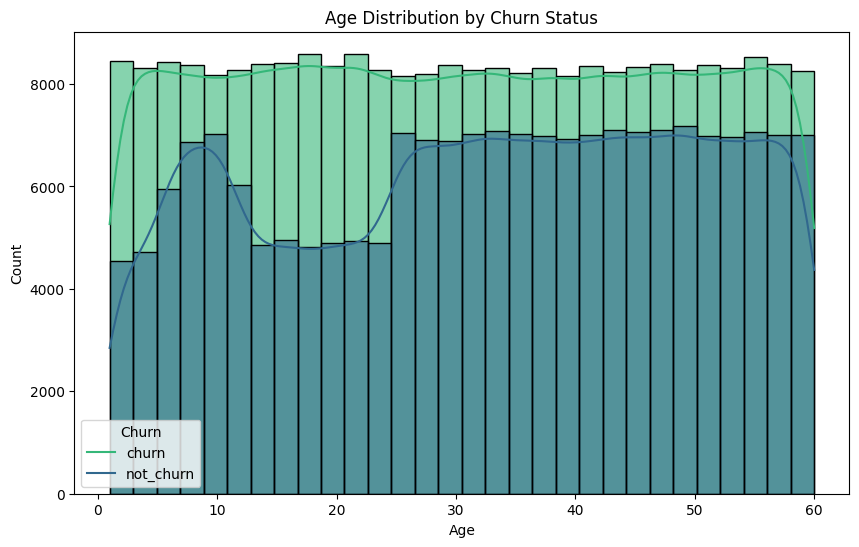

In [80]:

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Tenure', hue='Churn', kde=True, bins=30, palette='viridis', alpha=0.6)
plt.title('Age Distribution by Churn Status')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend(title='Churn', labels=['churn', 'not_churn'])
plt.show()

<ipython-input-81-3f7c38854ad4>:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-81-3f7c38854ad4>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




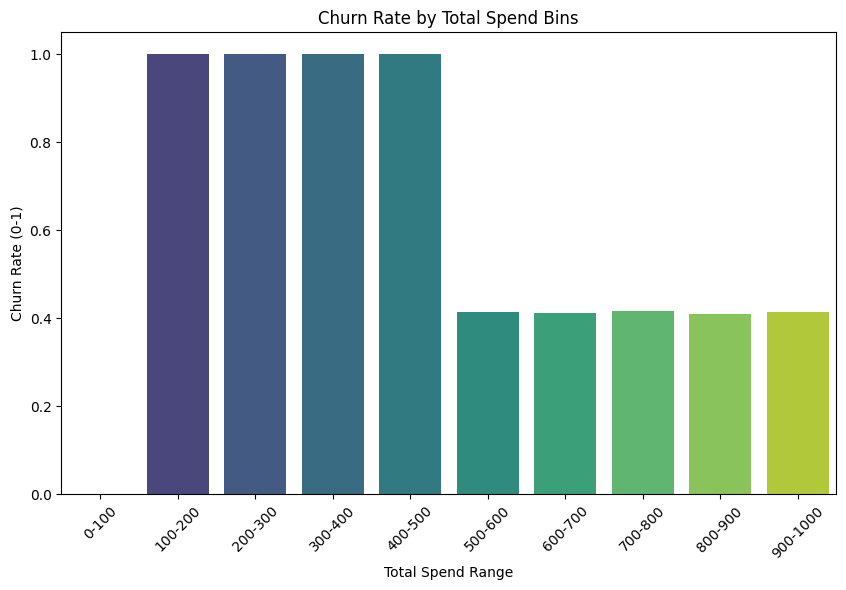

In [81]:
bins = range(0, 1100, 100)  # Adjust bin size as needed
labels = [f"{i}-{i+100}" for i in bins[:-1]]

# Assign each spend value to a bin
df['spend_bin'] = pd.cut(df['Total Spend'], bins=bins, labels=labels, right=False)
churn_rates = df.groupby('spend_bin')['Churn'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(x='spend_bin', y='Churn', data=churn_rates, palette='viridis')
plt.title('Churn Rate by Total Spend Bins')
plt.xlabel('Total Spend Range')
plt.ylabel('Churn Rate (0-1)')
plt.xticks(rotation=45)
plt.show()

Text(0.5, 1.0, 'ANOVA F-values on churn')

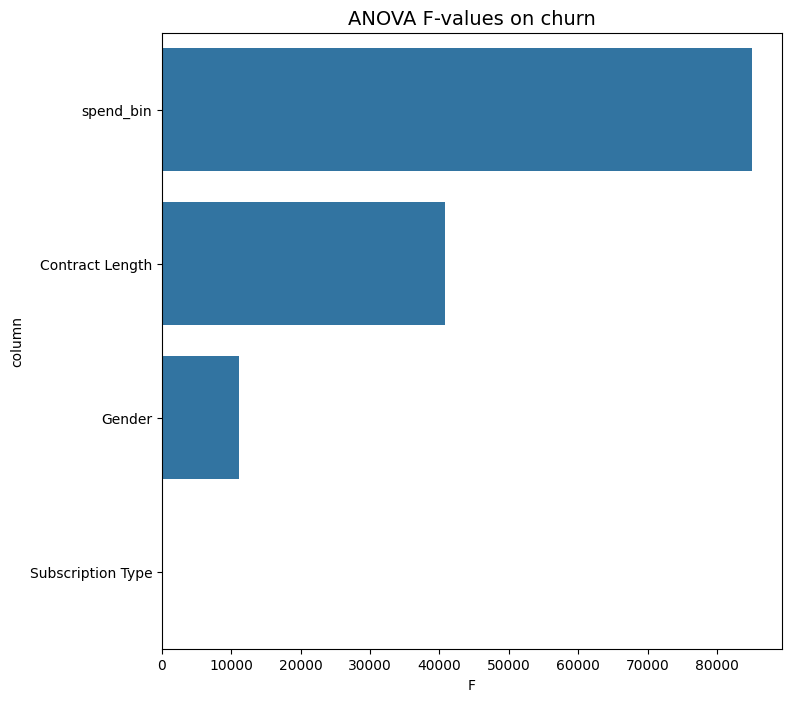

In [82]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split # Importing the necessary function


# Assuming 'df' is your DataFrame and 'churn' is your target variable
# Adjust 'test_size' and 'random_state' as needed
X = df.drop('Churn', axis=1)  # Features
y = df['Churn']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ... (Rest of your ANOVA code)

f=[];p=[]

cat_cols = list()
for idx, col in enumerate(X_train.dtypes):
    if col == 'category':
        cat_cols.append(X_train.dtypes.index[idx])

for col in cat_cols:

    indat = pd.DataFrame({'Churn': y_train, 'cat_col': X_train[col]})
    model = ols('Churn ~ C(cat_col)', data=indat).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    f.append(anova_table.iloc[0, 2])
    p.append(anova_table.iloc[0, 3])


anova = pd.DataFrame({'column': cat_cols, 'F': f, 'p':p})
anova = anova.sort_values(by=['F'], ascending=False)\
.reset_index(drop=True)

plt.figure(figsize=(8,8))
ax = sns.barplot(x=anova.F, y=anova.column)
plt.title('ANOVA F-values on churn', fontsize=14)

<ipython-input-83-4cbdbfc7c372>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




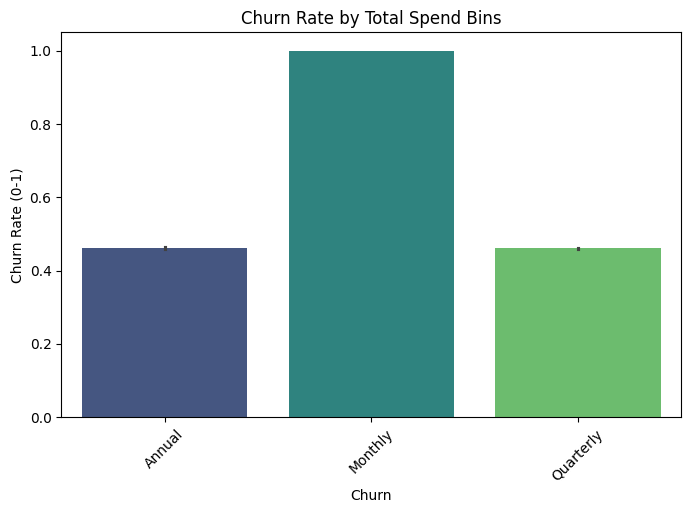

In [83]:
plt.figure(figsize=(8, 5))
sns.barplot(x='Contract Length', y='Churn', data=df, palette='viridis')
plt.title('Churn Rate by Total Spend Bins')
plt.xlabel('Churn')
plt.ylabel('Churn Rate (0-1)')
plt.xticks(rotation=45)
plt.show()

In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 440832 entries, 0 to 440832
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   CustomerID         440832 non-null  int64   
 1   Age                440832 non-null  int64   
 2   Gender             440832 non-null  category
 3   Tenure             440832 non-null  int64   
 4   Usage Frequency    440832 non-null  int64   
 5   Support Calls      440832 non-null  int64   
 6   Payment Delay      440832 non-null  int64   
 7   Subscription Type  440832 non-null  category
 8   Contract Length    440832 non-null  category
 9   Total Spend        440832 non-null  int64   
 10  Last Interaction   440832 non-null  int64   
 11  Churn              440832 non-null  int64   
 12  spend_bin          440721 non-null  category
dtypes: category(4), int64(9)
memory usage: 35.3 MB


In [85]:
df.describe(include='category').T

,count,unique,top,freq
Gender,440832,2,Male,250252
Subscription Type,440832,3,Standard,149128
Contract Length,440832,3,Annual,177198
spend_bin,440721,9,700-800,65341


In [86]:
print(df['Contract Length'].unique())
print('\n\n\n')
print(df['Subscription Type'].unique())

['Annual', 'Monthly', 'Quarterly']
Categories (3, object): ['Annual', 'Monthly', 'Quarterly']




['Standard', 'Basic', 'Premium']
Categories (3, object): ['Basic', 'Premium', 'Standard']


In [87]:
import plotly.express as px
data = df.head(1000)
fig = px.sunburst(data, path=['Subscription Type', 'Contract Length', 'Gender'], values='Churn')
fig.show()

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1727: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1727: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1727: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [88]:
fig = px.pie(df, values='Churn', names='Contract Length', title='Population of European continent')
fig.show()

fig = px.pie(df, values='Churn', names='Subscription Type', title='Population of European continent')
fig.show()

fig = px.pie(df, values='Churn', names='Gender', title='Population of European continent')
fig.show()

In [89]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn',
       'spend_bin'],
      dtype='object')

In [90]:
df.drop(columns=['spend_bin','CustomerID','Tenure','Usage Frequency'],inplace=True)
df.head()

,Age,Gender,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,30,Female,5,18,Standard,Annual,932,17,1
1,65,Female,10,8,Basic,Monthly,557,6,1
2,55,Female,6,18,Basic,Quarterly,185,3,1
3,58,Male,7,7,Standard,Monthly,396,29,1
4,23,Male,5,8,Basic,Monthly,617,20,1


In [91]:
gender_map = {'Female': 1, 'Male': 0}
df['Gender'] = df['Gender'].map(gender_map)
df.head()

,Age,Gender,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,30,1,5,18,Standard,Annual,932,17,1
1,65,1,10,8,Basic,Monthly,557,6,1
2,55,1,6,18,Basic,Quarterly,185,3,1
3,58,0,7,7,Standard,Monthly,396,29,1
4,23,0,5,8,Basic,Monthly,617,20,1


In [92]:
one_hot = pd.get_dummies(df['Subscription Type'], prefix='Subscription Type', dtype=int)
one_hot2 = pd.get_dummies(df['Contract Length'], prefix='Contract Length', dtype=int)
df_for_modeling = pd.concat([df, one_hot,one_hot2], axis=1)
df_for_modeling.head(5)

,Age,Gender,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn,Subscription Type_Basic,Subscription Type_Premium,Subscription Type_Standard,Contract Length_Annual,Contract Length_Monthly,Contract Length_Quarterly
0,30,1,5,18,Standard,Annual,932,17,1,0,0,1,1,0,0
1,65,1,10,8,Basic,Monthly,557,6,1,1,0,0,0,1,0
2,55,1,6,18,Basic,Quarterly,185,3,1,1,0,0,0,0,1
3,58,0,7,7,Standard,Monthly,396,29,1,0,0,1,0,1,0
4,23,0,5,8,Basic,Monthly,617,20,1,1,0,0,0,1,0


In [93]:
df_for_modeling.drop(columns=['Subscription Type','Contract Length'],inplace=True)
df_for_modeling.head()

,Age,Gender,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Subscription Type_Basic,Subscription Type_Premium,Subscription Type_Standard,Contract Length_Annual,Contract Length_Monthly,Contract Length_Quarterly
0,30,1,5,18,932,17,1,0,0,1,1,0,0
1,65,1,10,8,557,6,1,1,0,0,0,1,0
2,55,1,6,18,185,3,1,1,0,0,0,0,1
3,58,0,7,7,396,29,1,0,0,1,0,1,0
4,23,0,5,8,617,20,1,1,0,0,0,1,0


In [94]:
X = df_for_modeling.iloc[:, :-1]  # Features (all columns except last)
y = df_for_modeling.iloc[:, -1]   # Target (last column)

In [95]:
df_for_modeling.isnull().sum()

,0
Age,0
Gender,0
Support Calls,0
Payment Delay,0
Total Spend,0
Last Interaction,0
Churn,0
Subscription Type_Basic,0
Subscription Type_Premium,0
Subscription Type_Standard,0


In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [97]:
X_train.isnull().sum()

,0
Age,0
Gender,0
Support Calls,0
Payment Delay,0
Total Spend,0
Last Interaction,0
Churn,0
Subscription Type_Basic,0
Subscription Type_Premium,0
Subscription Type_Standard,0


In [102]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pickle

In [103]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
with open("logreg.pkl", "wb") as f:
    pickle.dump(logreg,f)

Accuracy: 0.9993557636469221

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     66446
           1       1.00      1.00      1.00     43762

    accuracy                           1.00    110208
   macro avg       1.00      1.00      1.00    110208
weighted avg       1.00      1.00      1.00    110208


Confusion Matrix:
 [[66441     5]
 [   66 43696]]


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [105]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)  # you can try different kernels

svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
with open("svm_model.pkl", "wb") as f:
    pickle.dump(svm_model,f)

Confusion Matrix:
[[66446     0]
 [    0 43762]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     66446
           1       1.00      1.00      1.00     43762

    accuracy                           1.00    110208
   macro avg       1.00      1.00      1.00    110208
weighted avg       1.00      1.00      1.00    110208

Accuracy: 1.0


In [106]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

knn_model = KNeighborsClassifier(n_neighbors=5)  # Start with k=5

knn_model.fit(X_train, y_train)

y_pred = knn_model.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
with open("knn_model.pkl", "wb") as f:
    pickle.dump(knn_model,f)

Confusion Matrix:
[[66446     0]
 [    0 43762]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     66446
           1       1.00      1.00      1.00     43762

    accuracy                           1.00    110208
   macro avg       1.00      1.00      1.00    110208
weighted avg       1.00      1.00      1.00    110208

Accuracy: 1.0


In [108]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

dt_model = DecisionTreeClassifier(random_state=42)

dt_model.fit(X_train, y_train)

y_pred = dt_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
with open("dt_model.pkl", "wb") as f:
    pickle.dump(dt_model,f)

Confusion Matrix:
[[66446     0]
 [    0 43762]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     66446
           1       1.00      1.00      1.00     43762

    accuracy                           1.00    110208
   macro avg       1.00      1.00      1.00    110208
weighted avg       1.00      1.00      1.00    110208

Accuracy: 1.0


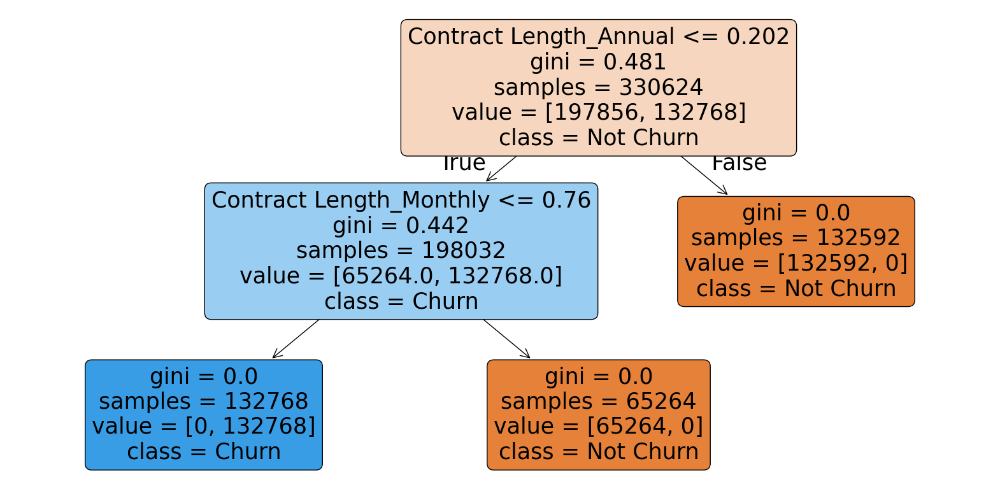

In [109]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plot_tree(dt_model,
          filled=True,
          rounded=True,
          class_names=['Not Churn', 'Churn'],  # Replace with your class names
          feature_names=X.columns,
          max_depth=3)  # Limit depth for readability
plt.show()

In [110]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score


rf_model = RandomForestClassifier(
    n_estimators=100,  # Number of trees
    random_state=42,
    class_weight='balanced'  # Handles class imbalance
)

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)[:, 1]

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_pred_proba))
with open("rf_model.pkl", "wb") as f:
    pickle.dump(rf_model,f)

Confusion Matrix:
[[66446     0]
 [    0 43762]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     66446
           1       1.00      1.00      1.00     43762

    accuracy                           1.00    110208
   macro avg       1.00      1.00      1.00    110208
weighted avg       1.00      1.00      1.00    110208

Accuracy: 1.0
ROC-AUC Score: 1.0


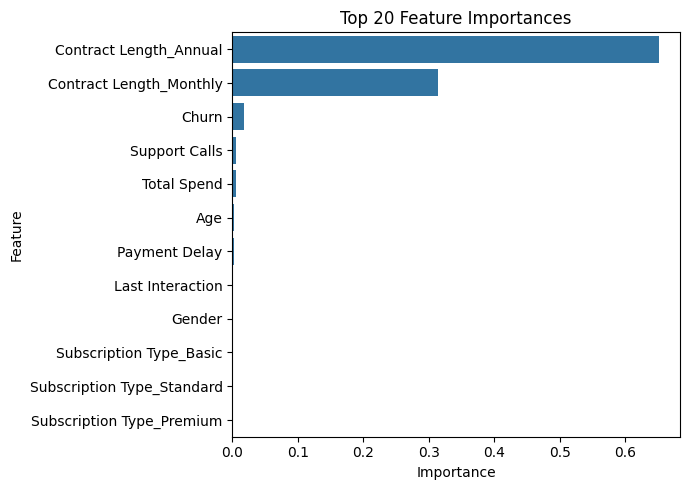

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns


importances = rf_model.feature_importances_
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance = feature_importance.sort_values('Importance', ascending=False)


plt.figure(figsize=(7, 5))
sns.barplot(x='Importance', y='Feature', data=feature_importance.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()